In [1]:
# TensorFlow Libraries
import tensorflow as tf
import tensorflow_hub as hub

# For downloading the image.
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# For drawing onto the image.
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# For measuring the inference time.
import time

# Generic
import os
import random

# For running inference on the TF-Hub module.
import tensorflow as tf
import tensorflow_hub as hub


In [2]:
# Random Images Directory Path
random_images = 'D:/Thirumalai/72075/HELMET03/JPEGImage/'
print(random_images)

D:/Thirumalai/72075/HELMET03/JPEGImage/


In [32]:
# Function to Display Image
def display_image(image,file):
    fig = plt.figure(figsize=(15, 10))
    plt.grid(False)
    plt.imshow(image)
    plt.title(file, fontsize=20)

    
# Function to Resize Image
def resize_image(img, new_width=200, new_height=200,display=False):
    img_path = os.path.join(random_images,img)
    pil_image = Image.open(img_path)
    pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
    pil_image_rgb = pil_image.convert("RGB")
    if display:
        display_image(pil_image, img)
def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  """Adds a bounding box to an image."""
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  # Reverse list and print from bottom to top.
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin


def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  """Overlay labeled boxes on an image with formatted scores and label names."""
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    #print("Font not found, using default font.")
    font = ImageFont.load_default()

  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

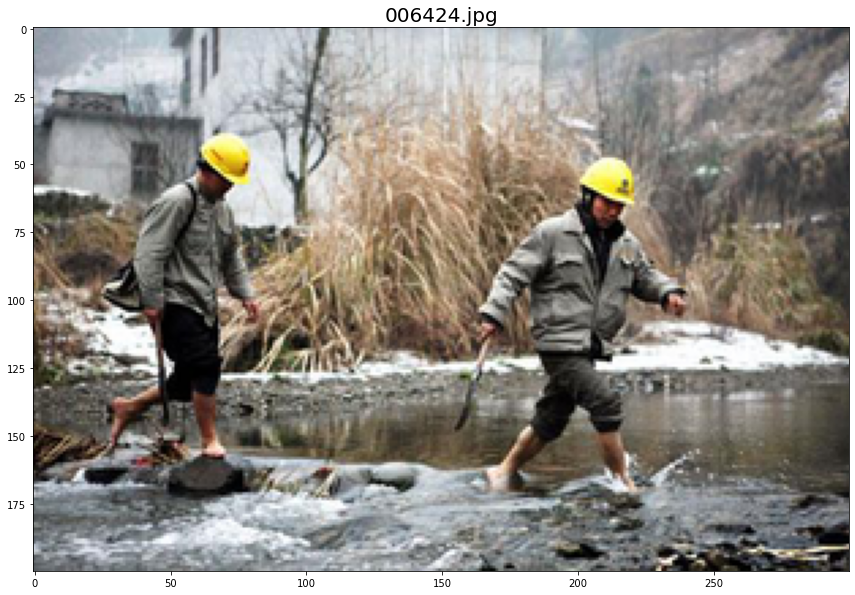

In [33]:
# Applying the Function 
resize_image(random.choice(os.listdir(random_images)),300,200,True)

In [5]:
# Function to Draw Bounding Boxes on Image
def draw_bounding_box_on_image(image,ymin,xmin,ymax,xmax,color,font,thickness=4,display_str_list=()):
       
    # Adds a bounding box to an image.
    draw = ImageDraw.Draw(image)
    im_width, im_height = image.size
    (left, right, top, bottom) = (xmin * im_width, xmax * im_width,ymin * im_height, ymax * im_height)
    draw.line([(left, top), (left, bottom), (right, bottom), (right, top),(left, top)],width=thickness,fill=color)
    
    # If the total height of the display strings added to the top of the bounding
    # box exceeds the top of the image, stack the strings below the bounding box
    # instead of above.
    display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
    
    # Each display_str has a top and bottom margin of 0.05x.
    total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)
    
    if top > total_display_str_height:
        text_bottom = top
    else:
        text_bottom = top + total_display_str_height
        
    # Reverse list and print from bottom to top.
    for display_str in display_str_list[::-1]:
        text_width, text_height = font.getsize(display_str)
        margin = np.ceil(0.05 * text_height)
        draw.rectangle([(left, text_bottom - text_height - 2 * margin),(left + text_width, text_bottom)],fill=color)
        draw.text((left + margin, text_bottom - text_height - margin),display_str, fill="black", font=font)
        text_bottom -= text_height - 2 * margin
        

# Function to Draw Boxes       
def draw_boxes(image, boxes, class_names, scores, max_boxes=3, min_score=0.1):
    
    # Overlay labeled boxes on an image with formatted scores and label names.
    colors = list(ImageColor.colormap.values())
    font = ImageFont.load_default()
    
    for i in range(min(boxes.shape[0], max_boxes)):
        if scores[i] >= min_score:
            ymin, xmin, ymax, xmax = tuple(boxes[i])
            display_str = "{}: {}%".format(class_names[i].decode("ascii"),int(100 * scores[i]))
            color = colors[hash(class_names[i]) % len(colors)]
            image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
            
            draw_bounding_box_on_image(image_pil,ymin,xmin,ymax,xmax,color,font,display_str_list=[display_str])
            np.copyto(image, np.array(image_pil))
    return image

In [6]:
# FasterRCNN + InceptionResNet v2 Path
model_path = "D:/Thirumalai/72075/HELMET03/openimages_v4_ssd_mobilenet_v2_1"
#object_detection_mobile_object_localizer_v1_1
#openimages_v4_ssd_mobilenet_v2_1

# Define Model
PreTrained_Model = hub.load(model_path).signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [7]:
# Function to Load Image from Random Image Folder using TensorFlow
def load_img(img_file):
    path = os.path.join(random_images,img_file)
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    return img

In [8]:
# Function to Detect Object using TensorFlow's Pretrained Model
def detect(model, img_file):
    
    img = load_img(img_file)
    
    converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
    
    start_time = time.time()   # Start Timer
    
    result = model(converted_img)   # Detection Using Pretrained Model downloaded above
    
    end_time = time.time()    # End Timer
    
    result = {key:value.numpy() for key,value in result.items()}
    
    print("Found %d objects." % len(result["detection_scores"]))
    print("Inference time (secs): ",'{:.2}'.format(end_time-start_time))
    
    image_with_boxes = draw_boxes(img.numpy(), result["detection_boxes"],result["detection_class_entities"], result["detection_scores"])
    
    display_image(image_with_boxes,img_file)

Found 100 objects.
Inference time (secs):  1.9e+01


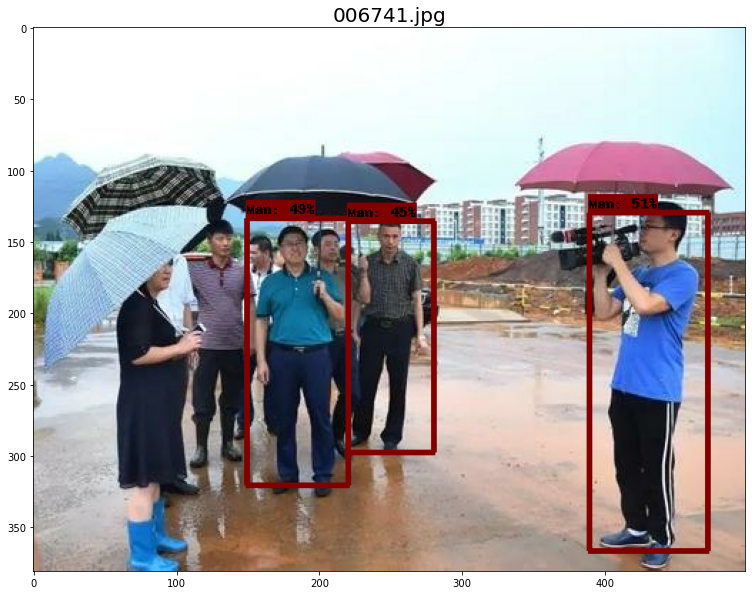

In [9]:
# Running the Detect Function
detect(PreTrained_Model, random.choice(os.listdir(random_images)))

In [25]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"
# "https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1", 
# "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"

detector = hub.load(module_handle).signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [26]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [27]:
def run_detector(detector, path):
  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
  #start_time = time.time()
  result = detector(converted_img)
  #end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

  #print("Found %d objects." % len(result["detection_scores"]))
  #print("Inference time: ", end_time-start_time)

  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

In [28]:
import os
import random

In [29]:
data_dir='D:/Thirumalai/72075/HELMET03/JPEGImage'
files0=os.listdir(data_dir)
print(len(files0))
N=list(range(len(files0)))
random.seed(2021)
random.shuffle(N)
files=np.array(files0)

1766


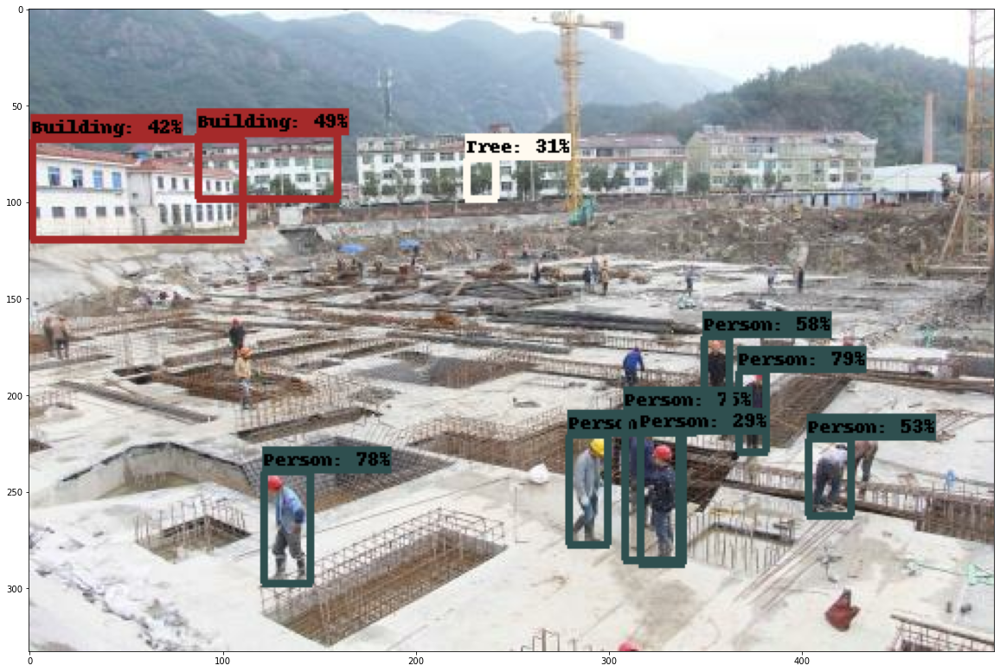

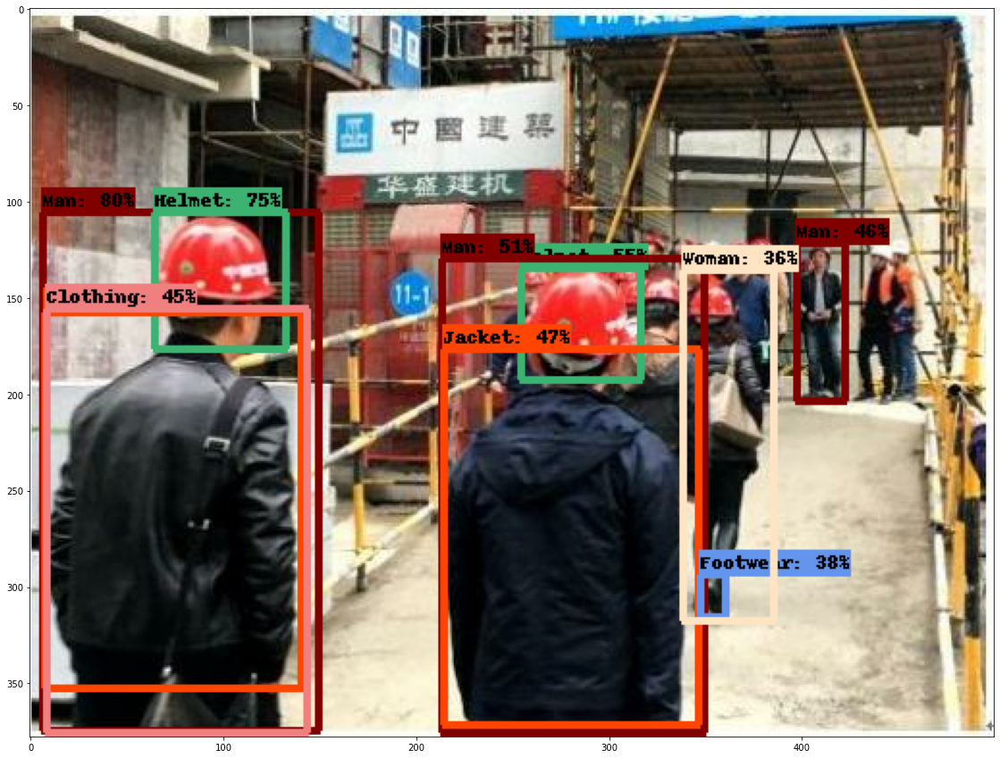

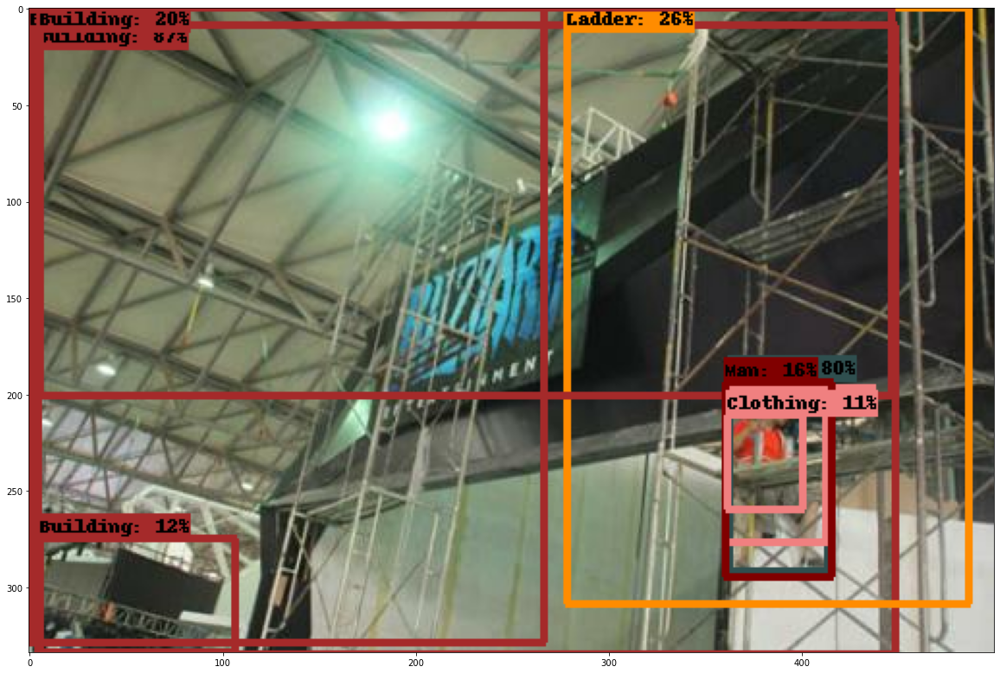

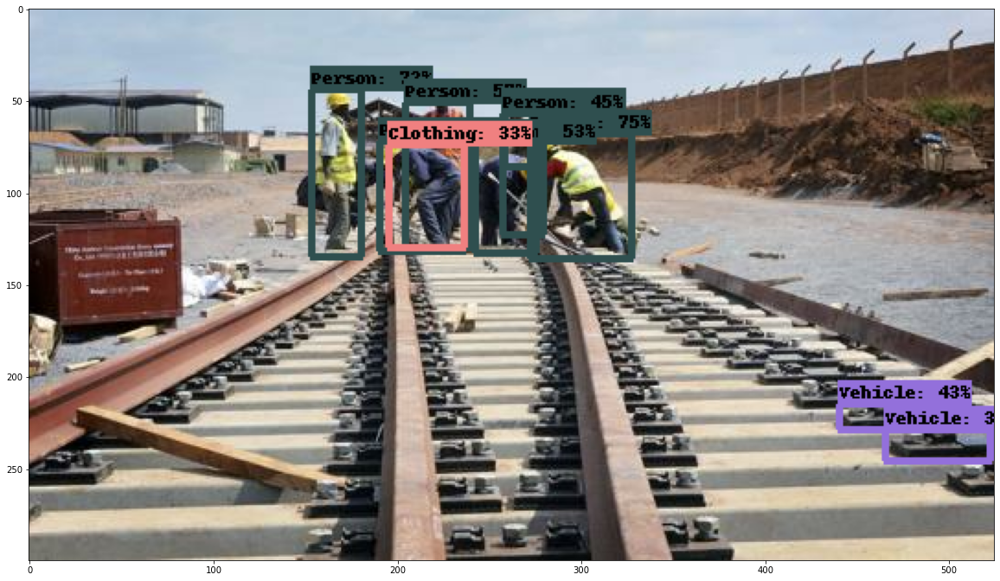

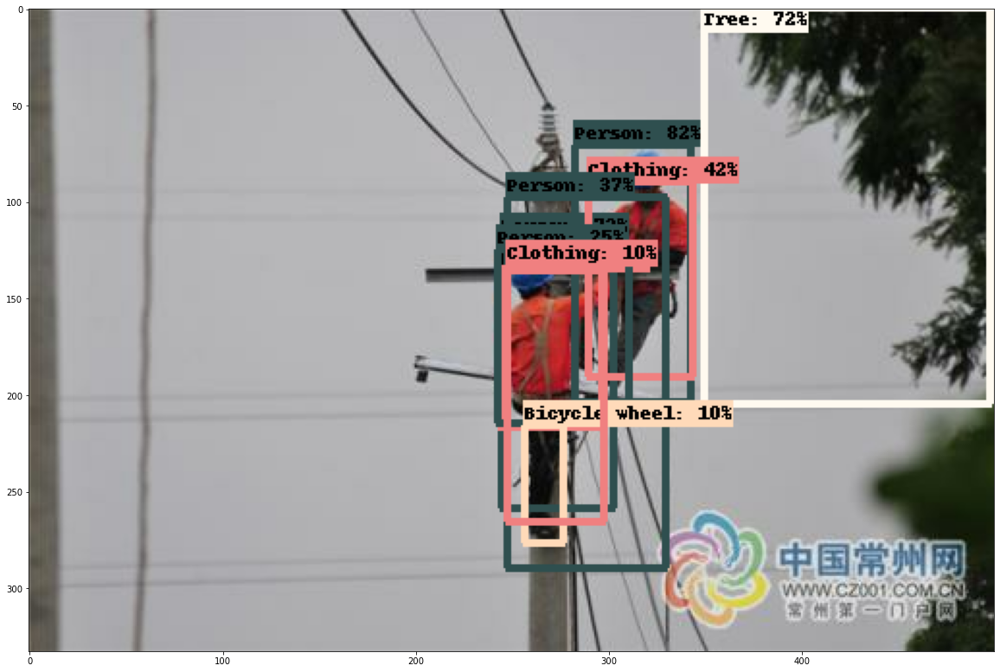

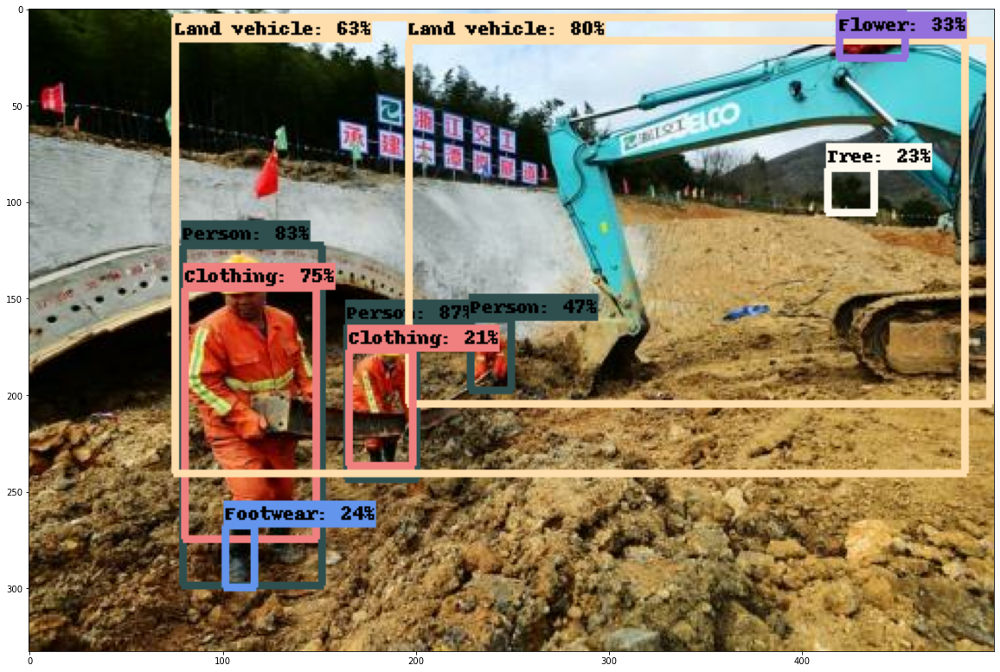

In [30]:
for im in files[N[0:6]]:
    path=os.path.join(data_dir,im)
    run_detector(detector, path)

In [16]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)


def download_and_resize_image(url, new_width=256, new_height=256,
                              display=False):
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
  pil_image_rgb = pil_image.convert("RGB")
  pil_image_rgb.save(filename, format="JPEG", quality=90)
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename


def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  """Adds a bounding box to an image."""
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  # Reverse list and print from bottom to top.
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin


def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  """Overlay labeled boxes on an image with formatted scores and label names."""
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    #print("Font not found, using default font.")
    font = ImageFont.load_default()

  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

Image downloaded to C:\Users\Admin\AppData\Local\Temp\tmpv4dauhnn.jpg.


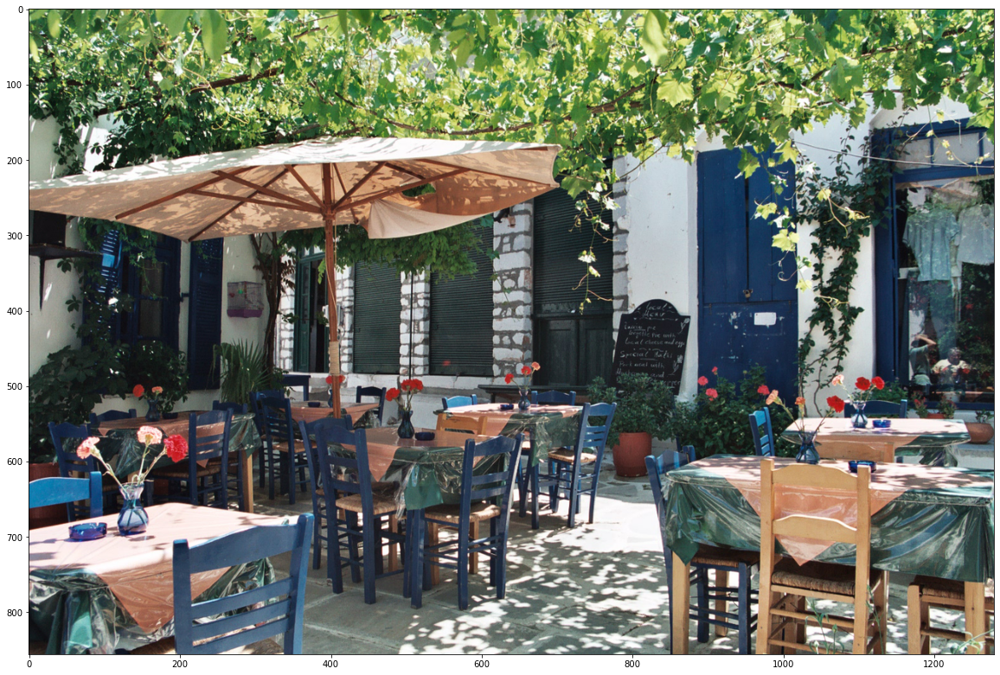

In [17]:
# By Heiko Gorski, Source: https://commons.wikimedia.org/wiki/File:Naxos_Taverna.jpg
image_url = "https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg"  #@param
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)

In [18]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"
# "https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1", 
# "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"

detector = hub.load(module_handle).signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [19]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [20]:
def run_detector(detector, path):
  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
  #start_time = time.time()
  result = detector(converted_img)
  #end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

  #print("Found %d objects." % len(result["detection_scores"]))
  #print("Inference time: ", end_time-start_time)

  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

In [21]:
#run_detector(detector, downloaded_image_path)

In [22]:
import os
import random

In [23]:
data_dir='D:/Thirumalai/72075/HELMET03/JPEGImage'
files0=os.listdir(data_dir)
print(len(files0))
N=list(range(len(files0)))
random.seed(2021)
random.shuffle(N)
files=np.array(files0)

1766


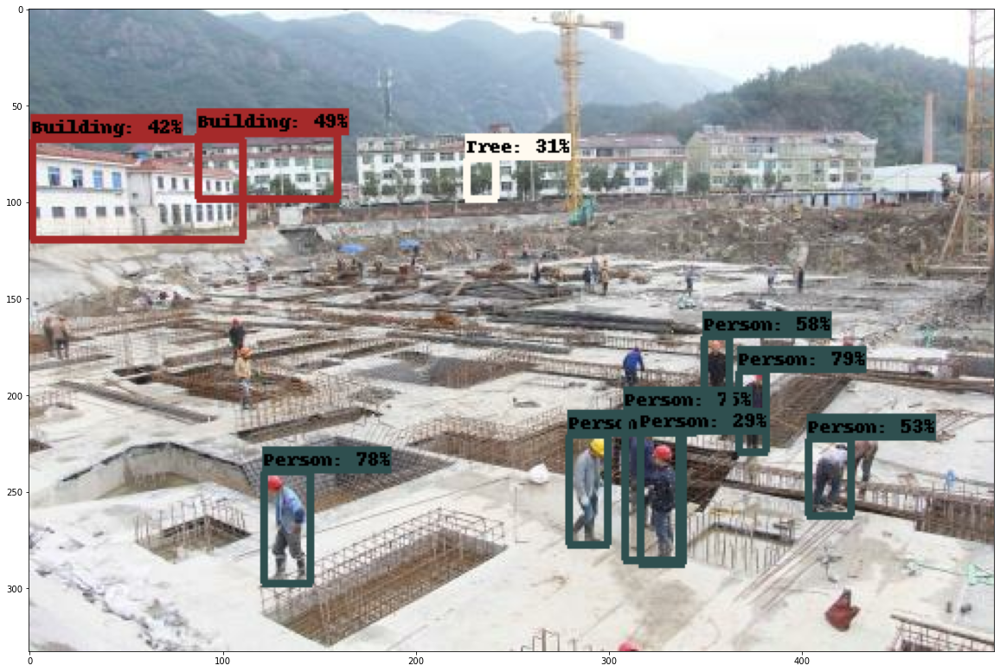

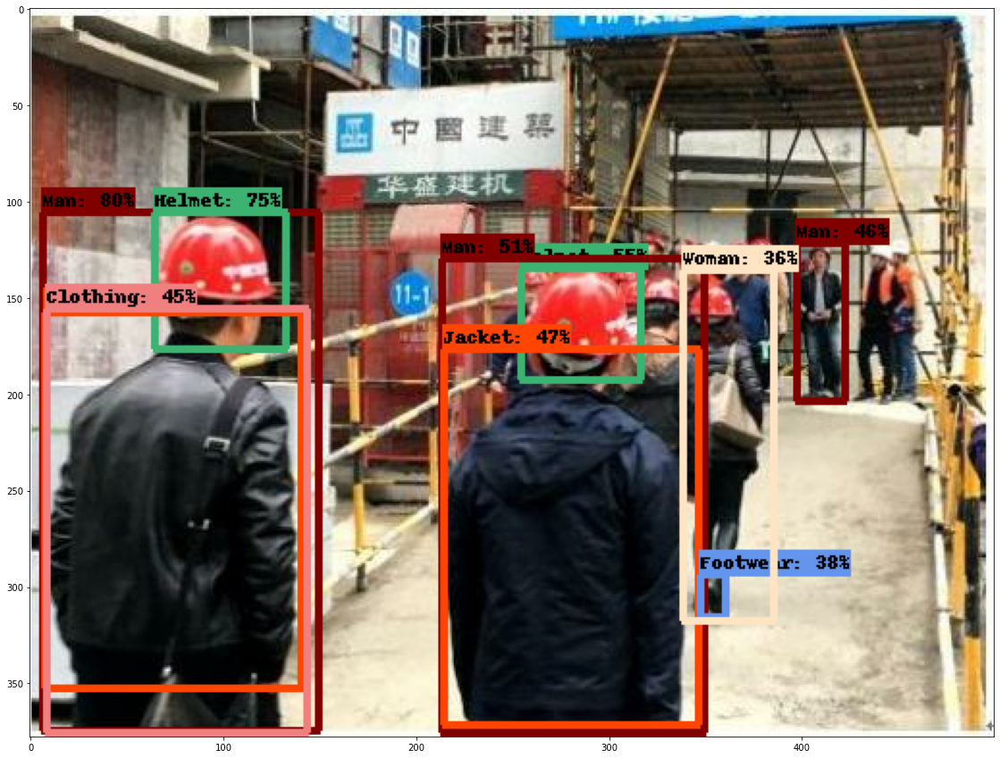

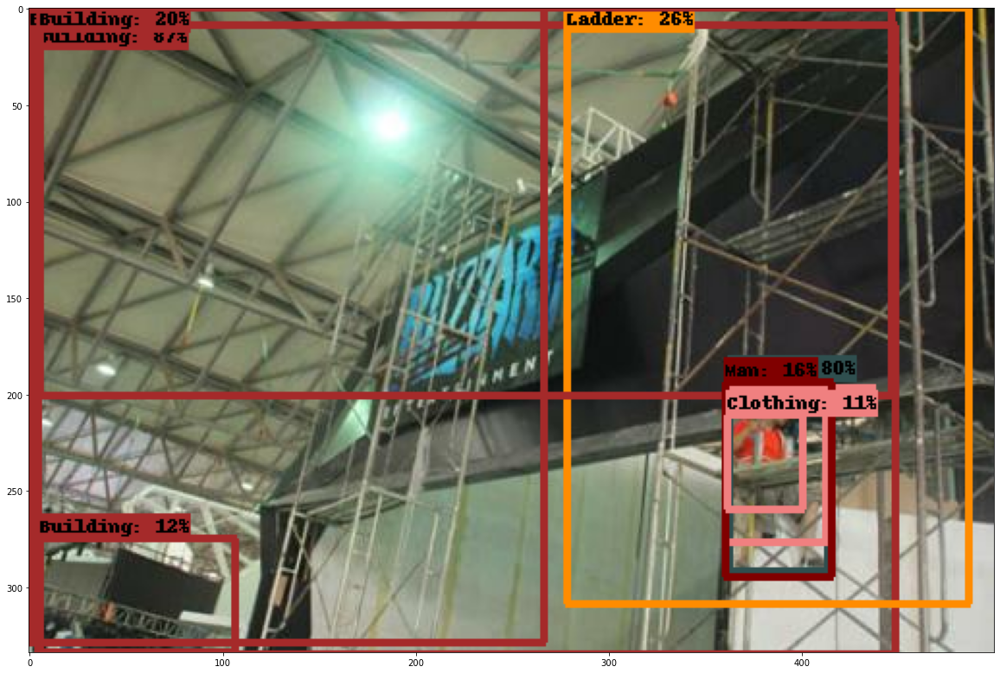

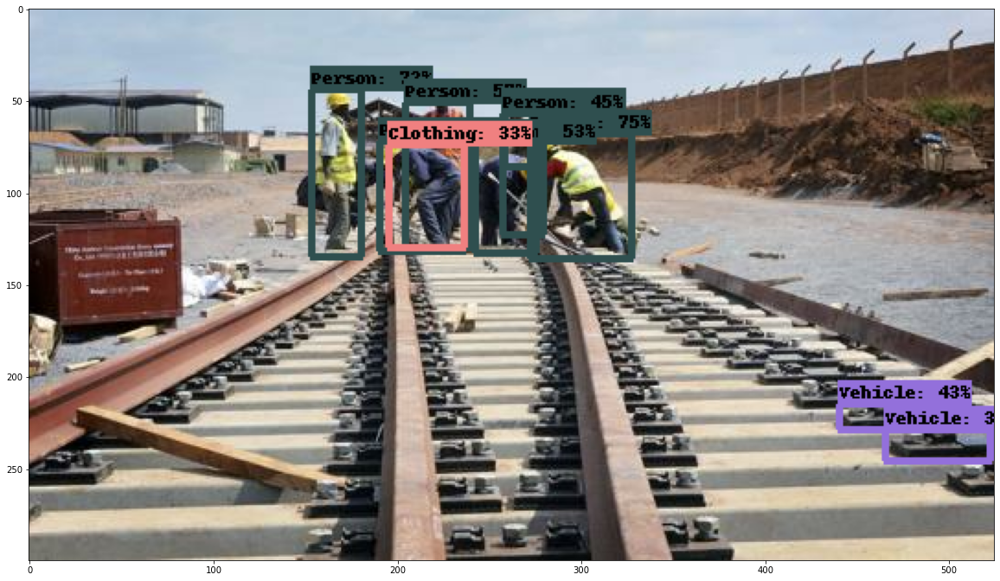

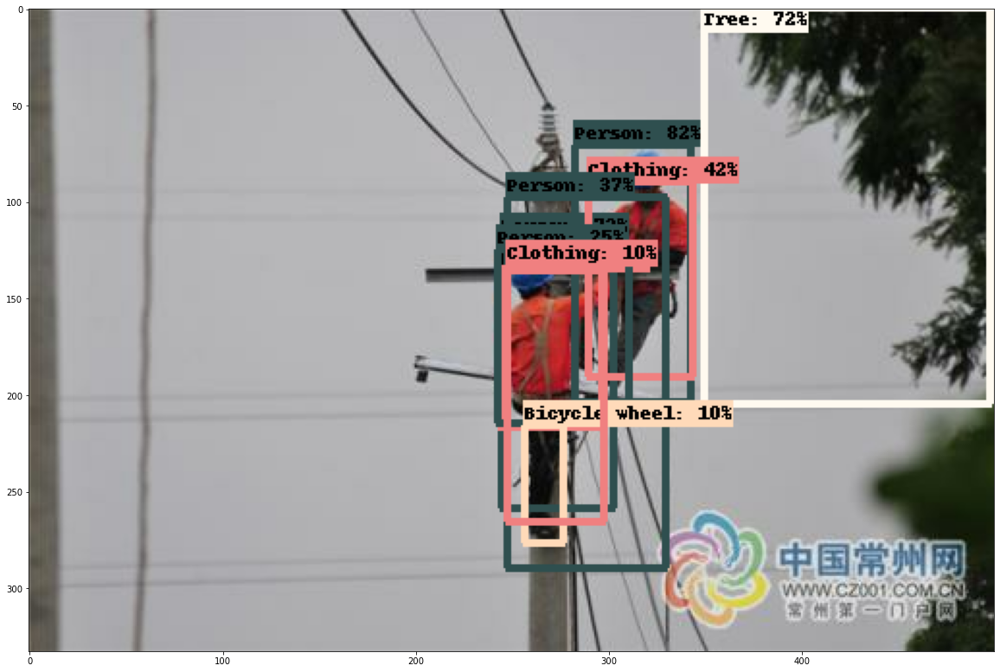

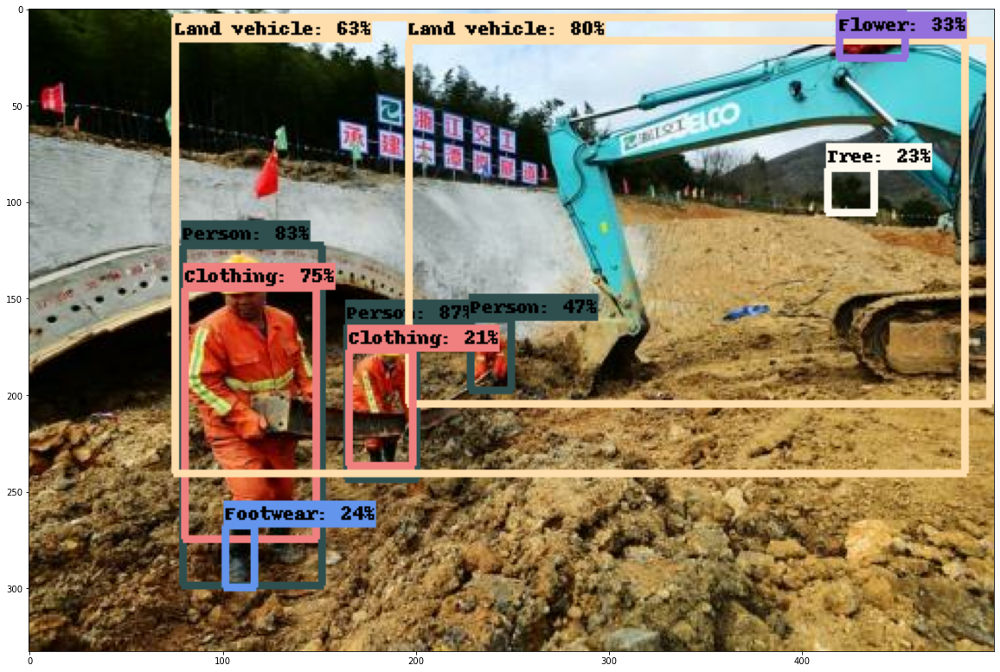

In [24]:
for im in files[N[0:6]]:
    path=os.path.join(data_dir,im)
    run_detector(detector, path)

In [34]:
class employee():
    def __init__(self, name, id, number,salary,age):
        self.name = name
        self.id = id
        self.number = number
        self.salary = salary
        self.age = age
emp1 = employee('thiru',1123,9894345386,30000,29)
print(emp1.__dict__)

{'name': 'thiru', 'id': 1123, 'number': 9894345386, 'salary': 30000, 'age': 29}


In [39]:
class employee():
    def __init__(self,name,id,salary):
        self.name = name
        self.id = id
        self.salary = salary
class childemployee(employee):
    def __init__(self,name,id,salary,age):
        self.name = name
        self.id = id
        self.salary = salary
        self.age = age
emp1 = employee('surya',22,20000)
emp2 = childemployee('surya',23,20000,27)
print(emp2.__dict__)

{'name': 'surya', 'id': 23, 'salary': 20000, 'age': 27}
